# Packages

In [114]:
import math
import time
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from qiskit import QuantumRegister, ClassicalRegister
from qiskit.extensions import XGate
from qiskit import QuantumCircuit, Aer
from qiskit import transpile, assemble
from qiskit.circuit.library import XGate, RYGate

In [119]:
from qiskit_ionq import IonQProvider
provider = IonQProvider("api")

In [116]:
def plot_to_compare(output_im, input_im):
    plt.imshow(output_im, cmap = 'gray')
    plt.title('measured image')
    plt.show()
    plt.imshow(input_im, cmap = 'gray')
    plt.title('real image')
    plt.show()

# FRQI

## Simulate FRQI in Qiskit

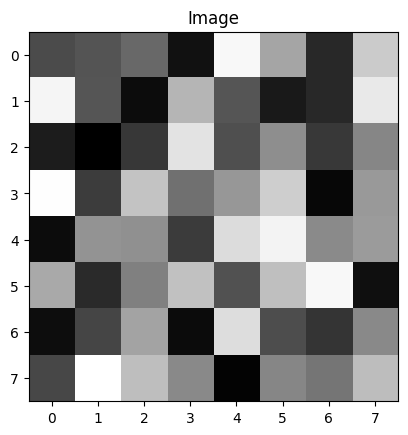

In [107]:
image = np.random.uniform(low=0, high=255, size=(8,8)).astype(int)
plt.imshow(image, cmap='gray')
plt.title('Image')
plt.show()

C:\Users\HCI\AppData\Local\Temp\ipykernel_12044\2585616894.py:46: DeprecationWarning: Using a qobj for run() is deprecated as of qiskit-aer 0.9.0 and will be removed no sooner than 3 months from that release date. Transpiled circuits should now be passed directly using `backend.run(circuits, **run_options).
  job = aer_sim.run(qobj)


[77, 85, 104, 16, 244, 161, 42, 200, 241, 85, 14, 178, 84, 26, 40, 225, 28, 0, 55, 221, 77, 141, 53, 132, 251, 64, 193, 109, 149, 202, 8, 150, 14, 144, 141, 58, 216, 240, 137, 152, 167, 41, 128, 190, 80, 187, 244, 14, 13, 69, 157, 11, 217, 78, 55, 137, 75, 248, 186, 136, 7, 131, 116, 185] 
 [ 75  84 104  19 244 163  42 200 241  85  14 179  85  27  42 229  30   2
  56 223  79 141  58 133 250  62 192 111 149 203   9 151  14 145 143  60
 216 240 137 153 167  43 127 190  81 188 244  17  15  70 161  13 217  77
  54 136  72 251 187 136   5 133 116 186]
1.66952 sec


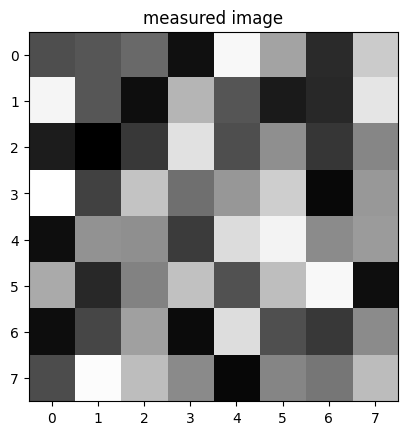

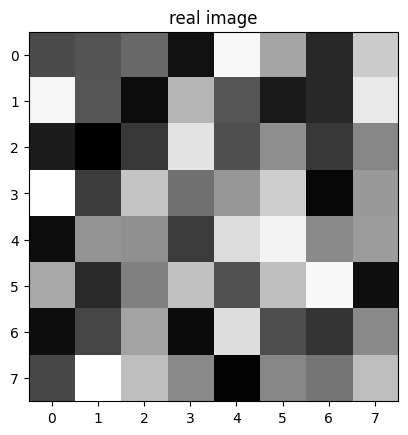

MSE = 2.796875


In [108]:
start = time.time()

input_im = image.copy().flatten()
thetas = np.interp(input_im, (0, 256), (0, np.pi/2))
coord_q_num = int(np.ceil(math.log(len(input_im), 2)))

O = QuantumRegister(coord_q_num, 'coordinates')
c = QuantumRegister(1,'c_reg')
cr = ClassicalRegister(O.size+c.size, "cl_reg")

qc_frqi = QuantumCircuit(c, O, cr)
num_qubits = qc_frqi.num_qubits
input_im = image.copy().flatten()
qc_frqi.id(c)
qc_frqi.h(O)

controls_ = []
for i, _ in enumerate(O):
    controls_.extend([O[i]])

for i, theta in enumerate(thetas):
    qubit_index_bin = "{0:b}".format(i).zfill(coord_q_num)
    
    for k, qub_ind in enumerate(qubit_index_bin):
        if int(qub_ind):
            qc_frqi.x(O[k])
            
    # qc_frqi.barrier()
    # for coord_or_intns in (0,1):
    qc_frqi.mcry(theta=2*theta,
                  q_controls=controls_,
                  q_target=c[0])

    # qc_frqi.barrier()
    for k, qub_ind in enumerate(qubit_index_bin):
        if int(qub_ind):
            qc_frqi.x(O[k])
           
    # qc_frqi.barrier()

qc_frqi.measure(list(reversed(range(qc_frqi.num_qubits))), list(range(cr.size)))

aer_sim = Aer.get_backend('aer_simulator')
t_qc_image = transpile(qc_frqi, aer_sim)
qobj = assemble(t_qc_image, shots=200000)
job = aer_sim.run(qobj)
result = job.result()
counts = result.get_counts()

classical_colors = []
for i in range(0, len(input_im)):
    color_list = []
    for item in counts.items():
        key = item[0]
        amount = item[1]
        bin_coord = key[1:]
        int_coord = int(bin_coord, 2)
        if int_coord == i:
            color_list.append((key[0], amount))
    color_amount = 0
    for color, amount in color_list:
        if not int(color):
            color_amount=color_amount+amount
    try:
        color = np.arccos((color_amount/sum(n for _, n in color_list))**(1/2))
        classical_colors.append(color)
    except ZeroDivisionError:
        print("ZeroDivisionError")
classical_colors = list(reversed(np.interp(classical_colors, (0, np.pi/2), (0, 256)).astype(int)))

end = time.time()
print(classical_colors, '\n', input_im)
print(f"{end - start:.5f} sec")

plot_to_compare(np.array(classical_colors).reshape(image.shape), image)

error = []
for i in range(image.size):
    del_ = image.flatten()[i] - classical_colors[i]
    err = del_**2
    error.append(err)
error 

MSE = sum(error)/image.size
print("MSE =",MSE)

## Simulate FRQI in IonQ

[76, 85, 104, 21, 243, 163, 42, 196, 242, 84, 15, 175, 87, 24, 43, 229, 28, 4, 54, 222, 78, 143, 57, 132, 248, 61, 192, 110, 151, 203, 8, 148, 14, 146, 142, 59, 214, 239, 133, 156, 168, 44, 129, 191, 80, 188, 245, 17, 14, 70, 158, 13, 215, 75, 52, 136, 72, 251, 187, 134, 2, 134, 114, 185] 
 [ 75  84 104  19 244 163  42 200 241  85  14 179  85  27  42 229  30   2
  56 223  79 141  58 133 250  62 192 111 149 203   9 151  14 145 143  60
 216 240 137 153 167  43 127 190  81 188 244  17  15  70 161  13 217  77
  54 136  72 251 187 136   5 133 116 186]
10.70537 sec


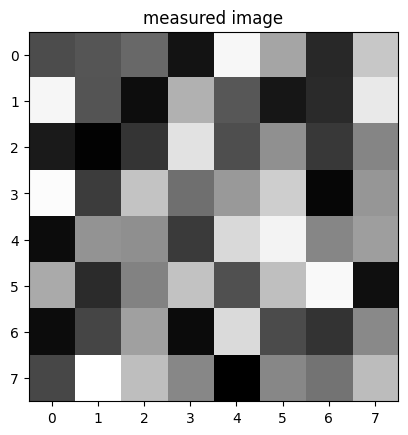

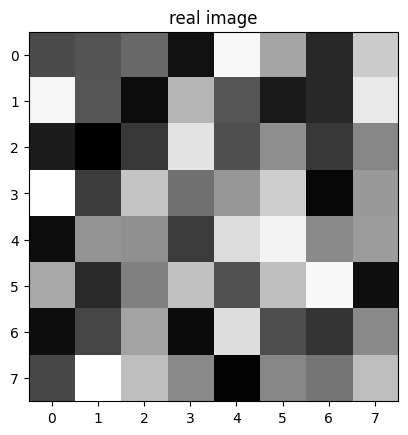

MSE = 2.796875


In [109]:
start = time.time()

input_im = image.copy().flatten()
thetas = np.interp(input_im, (0, 256), (0, np.pi/2))
coord_q_num = int(np.ceil(math.log(len(input_im), 2)))

O = QuantumRegister(coord_q_num, 'coordinates')
c = QuantumRegister(1,'c_reg')
cr = ClassicalRegister(O.size+c.size, "cl_reg")

qc_frqi = QuantumCircuit(c, O, cr)
num_qubits = qc_frqi.num_qubits
input_im = image.copy().flatten()
qc_frqi.id(c)
qc_frqi.h(O)

controls_ = []
for i, _ in enumerate(O):
    controls_.extend([O[i]])

for i, theta in enumerate(thetas):
    qubit_index_bin = "{0:b}".format(i).zfill(coord_q_num)
    
    for k, qub_ind in enumerate(qubit_index_bin):
        if int(qub_ind):
            qc_frqi.x(O[k])
            
    # qc_frqi.barrier()
    # for coord_or_intns in (0,1):
    qc_frqi.mcry(theta=2*theta,
                  q_controls=controls_,
                  q_target=c[0])

    # qc_frqi.barrier()
    for k, qub_ind in enumerate(qubit_index_bin):
        if int(qub_ind):
            qc_frqi.x(O[k])
           
    # qc_frqi.barrier()

qc_frqi.measure(list(reversed(range(qc_frqi.num_qubits))), list(range(cr.size)))

ionq_sim = provider.get_backend("ionq_simulator")
t_qc_image = transpile(qc_frqi, ionq_sim)
job = ionq_sim.run(t_qc_image, shots=200000)
result = job.result()
counts = result.get_counts()

classical_colors = []
for i in range(0, len(input_im)):
    color_list = []
    for item in counts.items():
        key = item[0]
        amount = item[1]
        bin_coord = key[1:]
        int_coord = int(bin_coord, 2)
        if int_coord == i:
            color_list.append((key[0], amount))
    color_amount = 0
    for color, amount in color_list:
        if not int(color):
            color_amount=color_amount+amount
    try:
        color = np.arccos((color_amount/sum(n for _, n in color_list))**(1/2))
        classical_colors.append(color)
    except ZeroDivisionError:
        print("ZeroDivisionError")
classical_colors = list(reversed(np.interp(classical_colors, (0, np.pi/2), (0, 256)).astype(int)))

end = time.time()
print(classical_colors, '\n', input_im)
print(f"{end - start:.5f} sec")

plot_to_compare(np.array(classical_colors).reshape(image.shape), image)

error = []
for i in range(image.size):
    del_ = image.flatten()[i] - classical_colors[i]
    err = del_**2
    error.append(err)
error

MSE = sum(error)/image.size
print("MSE =",MSE)

C:\Users\HCI\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\qiskit\visualization\circuit\matplotlib.py:266: FutureWarning: The default matplotlib drawer scheme will be changed to "iqp" in a following release. To silence this warning, specify the current default explicitly as style="clifford", or the new default as style="iqp".
  self._style, def_font_ratio = load_style(self._style)


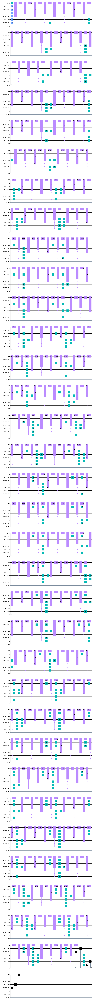

In [48]:
qc_frqi.draw('mpl')

# MCQRI

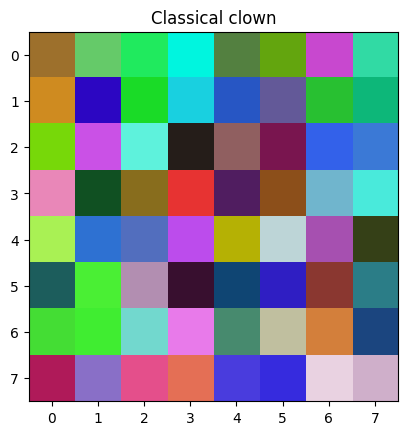

In [110]:
image = np.zeros((8,8,3))
image[:,:,0] = np.random.randint(low=0, high=256, size=(8,8))  
image[:,:,1] = np.random.randint(low=0, high=256, size=(8,8)) 
image[:,:,2] = np.random.randint(low=0, high=256, size=(8,8))  

plt.imshow(image.astype(np.uint8))
plt.title('Classical clown')
plt.show()


## Simulate MCQRI in Qiskit

C:\Users\HCI\AppData\Local\Temp\ipykernel_12044\2461666333.py:58: DeprecationWarning: Using a qobj for run() is deprecated as of qiskit-aer 0.9.0 and will be removed no sooner than 3 months from that release date. Transpiled circuits should now be passed directly using `backend.run(circuits, **run_options).
  result = aer_sim.run(qobj).result()


[159 111  44 102 201 104  33 235  95   0 242 221  81 125  64  99 164  16
 197  73 205  49 218 162 204 140  29  46   4 195  26 220  43  25 205 225
  37  86 193  99  89 150  39 191  48  14 183 121 115 218   5 205  80 227
  95 242 221  38  29  24 144  96  93 119  19  77  48  96 232  58 121 213
 235 132 186  16  82  33 133 109  30 228  51  49  79  26  95 139  80  24
 113 181 203  73 235 222 167 238  83  47 113 212  81 111 191 188  77 235
 181 178   0 187 213 214 165  80 175  52  63  25  26  89  90  74 240  51
 175 143 174  56  14  44  10  70 114  48  32 191 137  55  45  41 126 135
  67 223  53  63 237  47 111 214 206 234 121 234  68 138 113 189 192 159
 211 125  58  29  68 127 174  24  89 136 111 198 229  81 139 227 109  86
  74  58 222  51  44 221 233 209 225 206 177 200] 
 [157. 112.  44. 101. 202. 105.  32. 234.  94.   0. 245. 223.  83. 128.
  64.  99. 165.  14. 200.  72. 207.  49. 218. 164. 207. 139.  32.  44.
   6. 194.  26. 219.  39.  25. 208. 224.  39.  86. 196.  99.  89. 152.
  40.

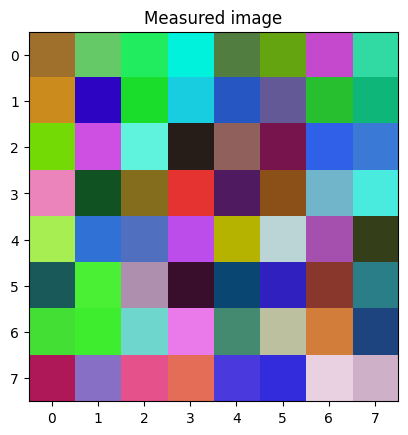

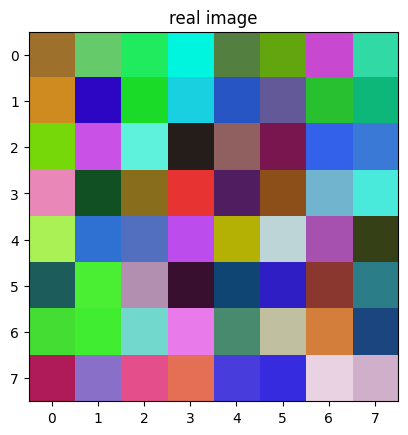

MSE = 3.078125


In [111]:
start = time.time()

def params(image):
    xqbits = math.log(image.shape[0],2)
    yqbits = math.log(image.shape[1],2)
    return int(xqbits), int(yqbits)

def rgb_circ(image):
    xqbit, yqbit = params(image)
    qr = QuantumRegister(xqbit + yqbit + 3) #3 stands for RGB qubits
    # color = qr[xqbit + yqbit:]
    # coordinate = qr[:xqbit + yqbit]
    cr = ClassicalRegister(xqbit + yqbit + 3, 'c')
    qc = QuantumCircuit(qr, cr)

    for k in range(int(np.floor((xqbit + yqbit)/2))):
        qc.swap(k,xqbit + yqbit - 1 - k)

    for i in range(xqbit + yqbit):
        qc.h(i)

    for layer_num, input_im in enumerate(image.T):
        input_im = input_im.flatten()
        input_im = np.interp(input_im, (0, 255), (0, np.pi/2))

        for i, pixel in enumerate(input_im):
            arr = list(range(xqbit + yqbit))
            arr.append(int(xqbit + yqbit + layer_num))
            cMry = RYGate(2*pixel).control(xqbit + yqbit)

            to_not = "{0:b}".format(i).zfill(xqbit + yqbit)
            for j, bit in enumerate(to_not):
                if int(bit):
                    qc.x(j)

            qc.append(cMry, arr)

            if i!=len(input_im)-1 or layer_num!=2:
                for j, bit in enumerate(to_not):
                    if int(bit):
                        qc.x(j)


    for k in range(int(np.floor((xqbit + yqbit)/2))):
        qc.swap(k, xqbit + yqbit - 1 - k)

    qc.swap(-1, -3)

    for i in range(xqbit + yqbit + 3):
        qc.measure(i, i)

    return qc

def run_qc(qc, shots=200000):
    aer_sim = Aer.get_backend('aer_simulator')
    t_qc = transpile(qc, aer_sim)
    qobj = assemble(t_qc, shots=shots)
    result = aer_sim.run(qobj).result()
    counts = result.get_counts(qc)
    return counts

def reconstruct_rgb(image, counts, to_print=True):
    output_ims = []
    for layer_num, input_im in enumerate(image.T):
        input_im = input_im.flatten()
        nums = []
        for iter in range(len(input_im)):
            num = []
            for item in counts.items():
                if int(item[0][3:], 2)==iter:
                    num.append((int(item[0][layer_num], 2), item[1]))
            nums.append(num)
        for l, num in enumerate(nums):
            my_set = {x[0] for x in num}
            nums[l] = [(i,sum(x[1] for x in num if x[0] == i)) for i in my_set]
        colors = []
        for num in nums:
            if len(num)==2:
                if num[0][0] == 0:
                    color = np.arccos((num[0][1]/(num[0][1]+num[1][1]))**(1/2))
                    colors.append(color)
                else:
                    color = np.arccos((num[1][1]/(num[0][1]+num[1][1]))**(1/2))
                    colors.append(color)
            else:
                if num[0][0] == 0:
                    colors.append(0)
                else:
                    colors.append(np.pi/2)
        output_im = np.interp(colors, (0, np.pi/2), (0, 255)).astype(int)
        if to_print:
            print(output_im, '\n', (image.T)[layer_num].copy().flatten())
        output_ims.append(output_im.reshape(image[:,:,0].shape))

    return np.array(output_ims).T

qc_mcqri = rgb_circ(image)
counts_mcqri = run_qc(qc_mcqri)

output_ims = reconstruct_rgb(image, counts_mcqri, to_print = False)

end = time.time()
print(output_ims.flatten(), '\n', image.flatten())
print(f"{end - start:.5f} sec")

plt.imshow(output_ims)
plt.title('Measured image')
plt.show()

plt.imshow(image.astype(np.uint8))
plt.title('real image')
plt.show()

error = []
for i in range(image.size):
    del_ = output_ims.flatten()[i] - image.flatten()[i]
    err = del_**2
    error.append(err)
error 

MSE = sum(error)/image.size
print("MSE =",MSE)

## Simulate MCQRI in IonQ

[160 111  44 101 203 105  31 235  95   0 244 219  83 127  61 100 165  11
 198  71 208  49 218 165 205 137  32  41   7 193  27 220  37  25 207 224
  38  86 195 101  90 151  39 192  48  13 181 122 119 214  10 200  79 229
  96 243 220  37  29  23 144  95  95 120  20  78  51  95 235  57 116 213
 233 135 183  16  77  34 134 109  27 231  52  49  83  28  95 140  78  26
 111 179 206  73 238 218 169 241  84  46 112 208  85 106 188 188  75 236
 181 178   5 188 213 215 164  80 176  53  63  23  28  92  91  72 238  50
 178 140 178  55  14  45  14  69 115  48  31 196 138  57  51  44 123 136
  68 220  51  64 236  50 116 213 205 231 120 234  70 139 111 190 192 159
 210 128  58  27  68 128 174  26  88 133 110 200 228  79 139 227 108  85
  70  59 221  52  42 222 234 209 224 205 174 202] 
 [157. 112.  44. 101. 202. 105.  32. 234.  94.   0. 245. 223.  83. 128.
  64.  99. 165.  14. 200.  72. 207.  49. 218. 164. 207. 139.  32.  44.
   6. 194.  26. 219.  39.  25. 208. 224.  39.  86. 196.  99.  89. 152.
  40.

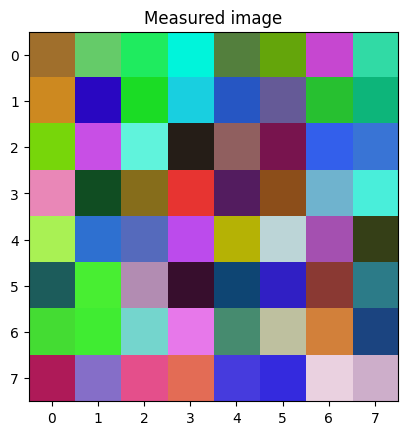

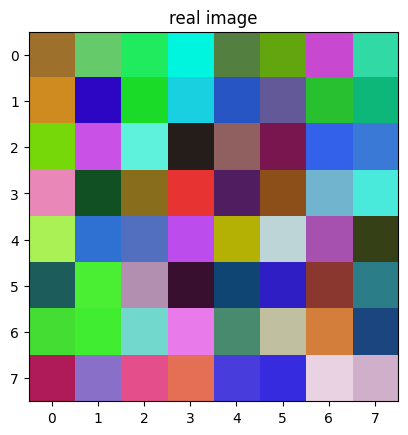

MSE = 2.046875


In [112]:
start = time.time()

def params(image):
    xqbits = math.log(image.shape[0],2)
    yqbits = math.log(image.shape[1],2)
    return int(xqbits), int(yqbits)

def rgb_circ(image):
    xqbit, yqbit = params(image)
    qr = QuantumRegister(xqbit + yqbit + 3) #3 stands for RGB qubits
    # color = qr[xqbit + yqbit:]
    # coordinate = qr[:xqbit + yqbit]
    cr = ClassicalRegister(xqbit + yqbit + 3, 'c')
    qc = QuantumCircuit(qr, cr)

    for k in range(int(np.floor((xqbit + yqbit)/2))):
        qc.swap(k,xqbit + yqbit - 1 - k)

    for i in range(xqbit + yqbit):
        qc.h(i)

    for layer_num, input_im in enumerate(image.T):
        input_im = input_im.flatten()
        input_im = np.interp(input_im, (0, 255), (0, np.pi/2))

        for i, pixel in enumerate(input_im):
            arr = list(range(xqbit + yqbit))
            arr.append(int(xqbit + yqbit + layer_num))
            cMry = RYGate(2*pixel).control(xqbit + yqbit)

            to_not = "{0:b}".format(i).zfill(xqbit + yqbit)
            for j, bit in enumerate(to_not):
                if int(bit):
                    qc.x(j)

            qc.append(cMry, arr)

            if i!=len(input_im)-1 or layer_num!=2:
                for j, bit in enumerate(to_not):
                    if int(bit):
                        qc.x(j)


    for k in range(int(np.floor((xqbit + yqbit)/2))):
        qc.swap(k, xqbit + yqbit - 1 - k)

    qc.swap(-1, -3)

    for i in range(xqbit + yqbit + 3):
        qc.measure(i, i)

    return qc

def run_qc(qc):
    ionq_sim = provider.get_backend("ionq_simulator")
    t_qc_image = transpile(qc, ionq_sim)
    job = ionq_sim.run(t_qc_image, shots=200000)
    result = job.result()
    counts = result.get_counts()
    return counts

def reconstruct_rgb(image, counts, to_print=True):
    output_ims = []
    for layer_num, input_im in enumerate(image.T):
        input_im = input_im.flatten()
        nums = []
        for iter in range(len(input_im)):
            num = []
            for item in counts.items():
                if int(item[0][3:], 2)==iter:
                    num.append((int(item[0][layer_num], 2), item[1]))
            nums.append(num)
        for l, num in enumerate(nums):
            my_set = {x[0] for x in num}
            nums[l] = [(i,sum(x[1] for x in num if x[0] == i)) for i in my_set]
        colors = []
        for num in nums:
            if len(num)==2:
                if num[0][0] == 0:
                    color = np.arccos((num[0][1]/(num[0][1]+num[1][1]))**(1/2))
                    colors.append(color)
                else:
                    color = np.arccos((num[1][1]/(num[0][1]+num[1][1]))**(1/2))
                    colors.append(color)
            else:
                if num[0][0] == 0:
                    colors.append(0)
                else:
                    colors.append(np.pi/2)
        output_im = np.interp(colors, (0, np.pi/2), (0, 255)).astype(int)
        if to_print:
            print(output_im, '\n', (image.T)[layer_num].copy().flatten())
        output_ims.append(output_im.reshape(image[:,:,0].shape))

    return np.array(output_ims).T

qc_mcqri = rgb_circ(image)
counts_mcqri = run_qc(qc_mcqri)

output_ims = reconstruct_rgb(image, counts_mcqri, to_print = False)

end = time.time()
print(output_ims.flatten(), '\n', image.flatten())
print(f"{end - start:.5f} sec")

plt.imshow(output_ims)
plt.title('Measured image')
plt.show()

plt.imshow(image.astype(np.uint8))
plt.title('real image')
plt.show()

error = []
for i in range(image.size):
    del_ = output_ims.flatten()[i] - image.flatten()[i]
    err = del_**2
    error.append(err)
error 

MSE = sum(error)/image.size
print("MSE =",MSE)

C:\Users\HCI\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\qiskit\visualization\circuit\matplotlib.py:266: FutureWarning: The default matplotlib drawer scheme will be changed to "iqp" in a following release. To silence this warning, specify the current default explicitly as style="clifford", or the new default as style="iqp".
  self._style, def_font_ratio = load_style(self._style)


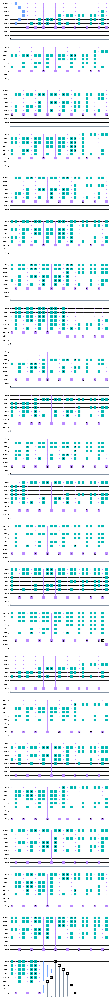

In [113]:
qc_mcqri.draw('mpl')

# NEQR

## Simulate NEQR in Qiskit

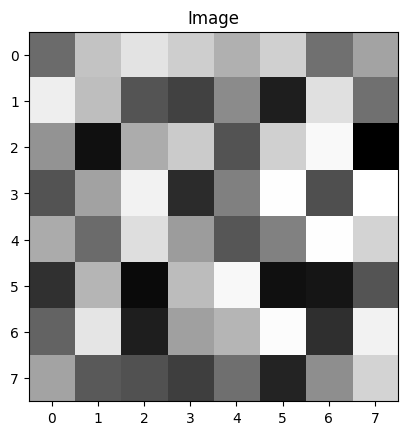

In [49]:
image = np.random.uniform(low=0, high=255, size=(8,8)).astype(int)
plt.imshow(image, cmap='gray')
plt.title('Image')
plt.show()

C:\Users\HCI\AppData\Local\Temp\ipykernel_12044\333516715.py:36: DeprecationWarning: Using a qobj for run() is deprecated as of qiskit-aer 0.9.0 and will be removed no sooner than 3 months from that release date. Transpiled circuits should now be passed directly using `backend.run(circuits, **run_options).
  job_neqr = aer_sim.run(qobj)


[106. 188. 217. 197. 170. 199. 111. 159. 227. 183.  85.  67. 136.  35.
 214. 111. 143.  22. 166. 195.  84. 199. 237.   7.  84. 157. 231.  47.
 125. 242.  80. 243. 165. 106. 212. 151.  87. 126. 242. 202.  53. 174.
  17. 181. 236.  22.  27.  85.  99. 219.  35. 155. 174. 240.  51. 231.
 159.  90.  83.  65. 110.  40. 138. 202.] 
 [106 188 217 197 170 199 111 159 227 183  85  67 136  35 214 111 143  22
 166 195  84 199 237   7  84 157 231  47 125 242  80 243 165 106 212 151
  87 126 242 202  53 174  17 181 236  22  27  85  99 219  35 155 174 240
  51 231 159  90  83  65 110  40 138 202]
1.21146 sec


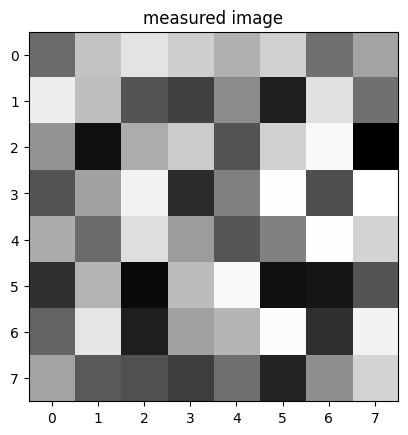

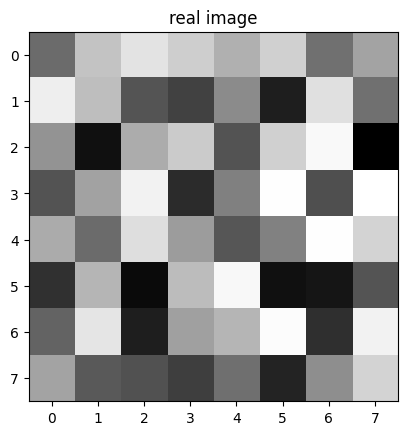

MSE = 0.0


In [50]:
start = time.time()

w_bits = int(np.ceil(math.log(image.shape[1],2)))
h_bits = int(np.ceil(math.log(image.shape[0],2)))
if not w_bits: w_bits = 1
if not h_bits: h_bits = 1
indx = QuantumRegister(w_bits+h_bits, 'indx')
intensity = QuantumRegister(8,'intensity')
cr = ClassicalRegister(len(indx)+len(intensity), 'cr')
qc_neqr = QuantumCircuit(intensity, indx, cr)
num_qubits = qc_neqr.num_qubits
input_im = image.copy().flatten()
qc_neqr.id(intensity)
qc_neqr.h(indx)
for i, pixel in enumerate(input_im):
    pixel_bin = "{0:b}".format(pixel).zfill(len(intensity))
    position = "{0:b}".format(i).zfill(len(indx))
    for j, coord in enumerate(position):
        if int(coord):
            qc_neqr.x(qc_neqr.num_qubits-j-1)
    for idx, px_value in enumerate(pixel_bin[::-1]):
        if(px_value=='1'):
            control_qubits = list(range(intensity.size, intensity.size + indx.size))
            target_qubit = intensity[idx]
            qc_neqr.mcx(control_qubits, target_qubit)
    if i!=len(input_im) - 1:
        for j, coord in enumerate(position):
            if int(coord):
                qc_neqr.x(qc_neqr.num_qubits-j-1)
    qc_neqr.barrier()
qc_neqr.measure(range(qc_neqr.num_qubits),range(cr.size))

aer_sim = Aer.get_backend('aer_simulator')
t_qc_image = transpile(qc_neqr, aer_sim)
qobj = assemble(t_qc_image, shots=200000)
job_neqr = aer_sim.run(qobj)
result_neqr = job_neqr.result()
counts_neqr = result_neqr.get_counts()

out_pixels = []
for item in counts_neqr:
    out_pixels.append((int(item[0:w_bits+h_bits], 2), int(item[w_bits+h_bits:],2)))
out_image = np.zeros((1, len(input_im)))
for pixel in out_pixels:
    out_image[0][pixel[0]] = pixel[1]
out_image = np.reshape(out_image, (image.shape))

end = time.time()
print(out_image.flatten(), '\n', image.flatten())
print(f"{end - start:.5f} sec")
plot_to_compare(out_image, image)


error = []
for i in range(image.size):
    del_ = out_image.flatten()[i] - image.flatten()[i]
    err = del_**2
    error.append(err)
error 

MSE = sum(error)/image.size
print("MSE =",MSE)

## Simulate NEQR in IonQ

C:\Users\HCI\AppData\Local\Temp\ipykernel_12044\1275209162.py:13: DeprecationWarning: The method ``qiskit.circuit.quantumcircuit.QuantumCircuit.i()`` is deprecated as of qiskit 0.45.0. It will be removed no earlier than 3 months after the release date. Use QuantumCircuit.id as direct replacement.
  qc_neqr.i(intensity)


[106. 188. 217. 197. 170. 199. 111. 159. 227. 183.  85.  67. 136.  35.
 214. 111. 143.  22. 166. 195.  84. 199. 237.   7.  84. 157. 231.  47.
 125. 242.  80. 243. 165. 106. 212. 151.  87. 126. 242. 202.  53. 174.
  17. 181. 236.  22.  27.  85.  99. 219.  35. 155. 174. 240.  51. 231.
 159.  90.  83.  65. 110.  40. 138. 202.] 
 [106 188 217 197 170 199 111 159 227 183  85  67 136  35 214 111 143  22
 166 195  84 199 237   7  84 157 231  47 125 242  80 243 165 106 212 151
  87 126 242 202  53 174  17 181 236  22  27  85  99 219  35 155 174 240
  51 231 159  90  83  65 110  40 138 202]
8.13165 sec


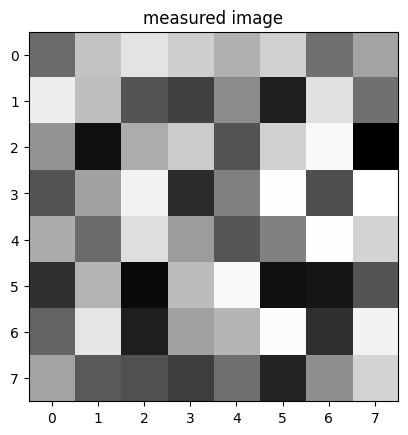

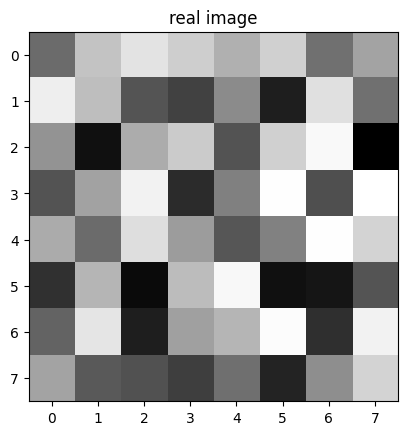

MSE = 0.0


In [51]:
start = time.time()

w_bits = int(np.ceil(math.log(image.shape[1],2)))
h_bits = int(np.ceil(math.log(image.shape[0],2)))
if not w_bits: w_bits = 1
if not h_bits: h_bits = 1
indx = QuantumRegister(w_bits+h_bits, 'indx')
intensity = QuantumRegister(8,'intensity')
cr = ClassicalRegister(len(indx)+len(intensity), 'cr')
qc_neqr = QuantumCircuit(intensity, indx, cr)
num_qubits = qc_neqr.num_qubits
input_im = image.copy().flatten()
qc_neqr.i(intensity)
qc_neqr.h(indx)
for i, pixel in enumerate(input_im):
    pixel_bin = "{0:b}".format(pixel).zfill(len(intensity))
    position = "{0:b}".format(i).zfill(len(indx))
    for j, coord in enumerate(position):
        if int(coord):
            qc_neqr.x(qc_neqr.num_qubits-j-1)
    for idx, px_value in enumerate(pixel_bin[::-1]):
        if(px_value=='1'):
            control_qubits = list(range(intensity.size, intensity.size + indx.size))
            target_qubit = intensity[idx]
            qc_neqr.mcx(control_qubits, target_qubit)
    if i!=len(input_im) - 1:
        for j, coord in enumerate(position):
            if int(coord):
                qc_neqr.x(qc_neqr.num_qubits-j-1)
    qc_neqr.barrier()
qc_neqr.measure(range(qc_neqr.num_qubits),range(cr.size))

ionq_sim = provider.get_backend("ionq_simulator")
t_qc_image = transpile(qc_neqr, ionq_sim)
job_neqr = ionq_sim.run(t_qc_image, shots=200000)
result_neqr = job_neqr.result()
counts_neqr = result_neqr.get_counts()

out_pixels = []
for item in counts_neqr:
    out_pixels.append((int(item[0:w_bits+h_bits], 2), int(item[w_bits+h_bits:],2)))
out_image = np.zeros((1, len(input_im)))
for pixel in out_pixels:
    out_image[0][pixel[0]] = pixel[1]
out_image = np.reshape(out_image, (image.shape))

end = time.time()
print(out_image.flatten(), '\n', image.flatten())
print(f"{end - start:.5f} sec")
plot_to_compare(out_image, image)


error = []
for i in range(image.size):
    del_ = out_image.flatten()[i] - image.flatten()[i]
    err = del_**2
    error.append(err)
error 

MSE = sum(error)/image.size
print("MSE =",MSE)

C:\Users\HCI\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\qiskit\visualization\circuit\matplotlib.py:266: FutureWarning: The default matplotlib drawer scheme will be changed to "iqp" in a following release. To silence this warning, specify the current default explicitly as style="clifford", or the new default as style="iqp".
  self._style, def_font_ratio = load_style(self._style)


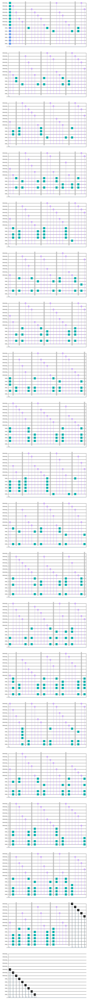

In [52]:
qc_neqr.draw('mpl')

# QSMC/QSNC

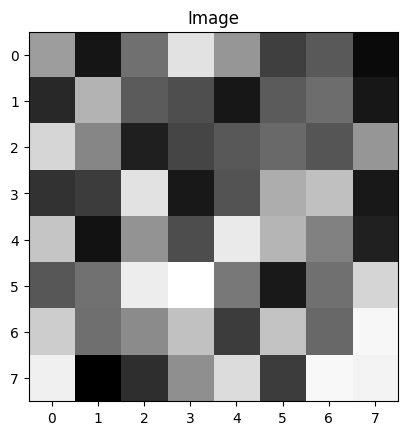

In [53]:
image = np.random.uniform(low=0, high=255, size=(8,8)).astype(int)
plt.imshow(image, cmap='gray')
plt.title('Image')
plt.show()

## Simulate QSMC/QSNC in Qiskit

C:\Users\HCI\AppData\Local\Temp\ipykernel_12044\1542327161.py:66: DeprecationWarning: Using a qobj for run() is deprecated as of qiskit-aer 0.9.0 and will be removed no sooner than 3 months from that release date. Transpiled circuits should now be passed directly using `backend.run(circuits, **run_options).
  job_qsmc = aer_sim.run(qobj)


[154  20 110 220 145  60  86   8  39 176  90  75  25  89 107  23 211 133
  29  68  88 102  83 147  49  61 220  23  83 169 185  23 192  20 144  76
 232 179 131  34  86 110 233 249 116  26 110 207 199 108 135 188  60 194
 103 244 235   0  45 140 216  61 245 239] 
 [154  21 110 222 148  62  88  10  41 176  90  77  23  90 107  23 210 132
  31  68  87 104  84 148  50  59 222  24  82 170 189  24 194  18 146  76
 230 178 127  32  86 111 233 251 118  25 110 209 201 109 137 190  59 193
 102 243 236   0  46 141 216  59 244 240]
coords =  [ 0  0  2  3  3  4  5  7  7  8  9 11 11 13 14 15 15 16 18 19 20 21 22 22
 24 24 26 26 28 29 29 31 31 32 33 34 36 36 37 39 40 41 41 42 43 44 45 46
 47 48 50 51 52 53 54 54 55 56 57 58 60 60 61 62]
2.25489 sec


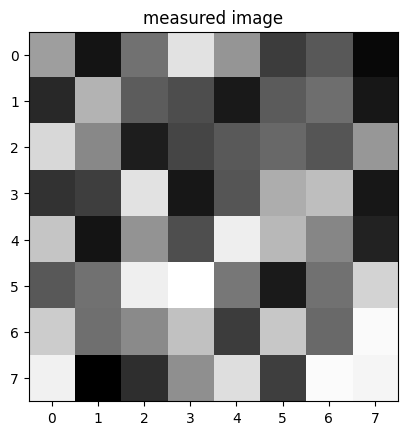

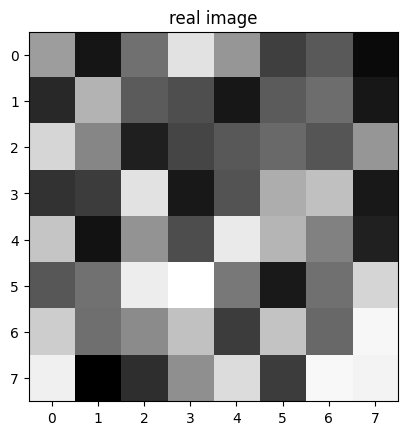

MSE = 2.46875


In [56]:
start = time.time()

w_bits = int(np.ceil(math.log(image.shape[1],2)))
h_bits = int(np.ceil(math.log(image.shape[0],2)))
if not w_bits: w_bits = 1
if not h_bits: h_bits = 1

im_list = image.flatten()
ind_list = sorted(range(len(im_list)), key=lambda k:im_list[k])
max_index = max(ind_list)
#now in angles: theta = intensity, phi = coordinate
thetas = np.interp(im_list, (0, 256), (0, np.pi/2))
phis = np.interp(range(len(im_list)), (0, len(im_list)), (0, np.pi/2))
num_ind_bits = int(np.ceil(math.log(len(im_list),2)))
if not num_ind_bits:
    num_ind_bits = 1

O = QuantumRegister(num_ind_bits, 'o_reg')
color = QuantumRegister(1,'color')
coordinate = QuantumRegister(1, 'coordinate')
cr = ClassicalRegister(O.size+color.size+coordinate.size, "cl_reg")

qc_qsmc = QuantumCircuit(color, coordinate, O, cr)
num_qubits = qc_qsmc.num_qubits
input_im = image.copy().flatten()
qc_qsmc.id(color)
qc_qsmc.id(coordinate)
qc_qsmc.h(O)
controls_ = []
for i, _ in enumerate(O):
    controls_.extend([O[i]])

for i, (phi, theta) in enumerate(zip(phis, thetas)):
    qubit_index_bin = "{0:b}".format(i).zfill(num_ind_bits)
    
    for k, qub_ind in enumerate(qubit_index_bin):
        if int(qub_ind):
            qc_qsmc.x(O[k])
            

    
    for coord_or_intns in (0,1):
        if not coord_or_intns:
            qc_qsmc.mcry(theta=2*theta,
                          q_controls=controls_,
                          q_target=color[0])
        else:
            qc_qsmc.mcry(theta=2*phi,
                          q_controls=controls_,
                          q_target=coordinate[0])
       

    
    if  i!=len(thetas) - 1:
        for k, qub_ind in enumerate(qubit_index_bin):
            if int(qub_ind):
                qc_qsmc.x(O[k])
                


qc_qsmc.measure(list(reversed(range(qc_qsmc.num_qubits))), list(range(cr.size)))   

aer_sim = Aer.get_backend('aer_simulator')
t_qc_image = transpile(qc_qsmc, aer_sim)
qobj = assemble(t_qc_image, shots=200000)
job_qsmc = aer_sim.run(qobj)
result_qsmc = job_qsmc.result()
counts_qsmc = result_qsmc.get_counts()

classical_colors = []
classical_coords = []
for i in range(0, max_index+1):
    color_list = []
    coord_list = []
    for item in counts_qsmc.items():
        key = item[0]
        amount = item[1]
        bin_coord = key[2:]
        int_coord = int(bin_coord, 2)
        if int_coord == i:
                color_list.append((key[0], amount))
                coord_list.append((key[1], amount))
    color_amount = 0
    for color, amount in color_list:
        if not int(color):
            color_amount=color_amount+amount
    try:
        color = np.arccos((color_amount/sum(n for _, n in color_list))**(1/2))
        classical_colors.append(color)
    except ZeroDivisionError:
        print("ZeroDivisionError")
        
    coord_amount = 0
    for coord, amount in coord_list:
        if not int(coord):
            coord_amount=coord_amount+amount
    try:
        coord = np.arccos((coord_amount/sum(n for _, n in coord_list))**(1/2))
        classical_coords.append(coord)
    except ZeroDivisionError:
        print("ZeroDivisionError")
classical_colors = np.interp(classical_colors, (0, np.pi/2), (0, 256)).astype(int)
classical_coords = np.interp(classical_coords, (0, np.pi/2), (0, len(im_list))).astype(int)

output_im = classical_colors.reshape(image.shape)

end = time.time()
print(output_im.flatten(), '\n', image.flatten())
print("coords = ",classical_coords)
print(f"{end - start:.5f} sec")
plot_to_compare(output_im, image)


error = []
for i in range(image.size):
    del_ = output_im.flatten()[i] - image.flatten()[i]
    err = del_**2
    error.append(err)
    
MSE = sum(error)/image.size
print("MSE =",MSE)


## Simulate QSMC/QSNC in IonQ

[154  20 111 222 147  61  92  10  39 172  90  77  21  89 107  21 212 129
  32  68  86 103  81 147  47  59 222  26  83 169 189  24 191  16 145  73
 231 180 127  29  84 110 233 251 119  23 107 208 199 108 137 186  59 192
 102 243 235   0  48 140 218  55 243 238] 
 [154  21 110 222 148  62  88  10  41 176  90  77  23  90 107  23 210 132
  31  68  87 104  84 148  50  59 222  24  82 170 189  24 194  18 146  76
 230 178 127  32  86 111 233 251 118  25 110 209 201 109 137 190  59 193
 102 243 236   0  46 141 216  59 244 240]
coords =  [ 0  1  1  3  3  5  6  6  7  8 10 11 11 13 14 14 15 17 18 19 19 21 22 23
 24 24 26 26 27 29 30 30 32 33 33 35 36 37 37 39 40 40 42 43 44 44 45 47
 48 48 49 51 52 52 53 54 56 56 58 59 59 61 62 62]
12.23381 sec


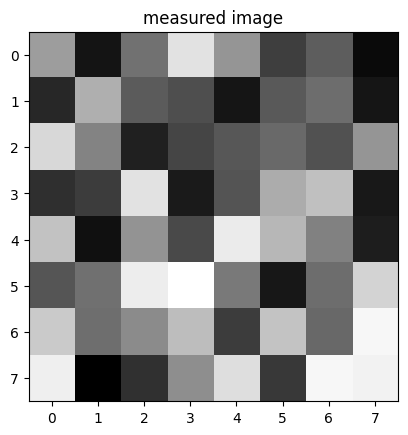

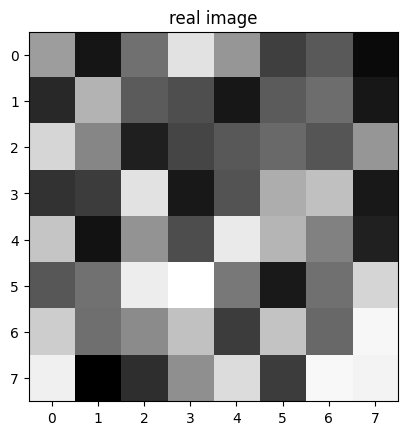

MSE = 3.125


In [57]:
start = time.time()

w_bits = int(np.ceil(math.log(image.shape[1],2)))
h_bits = int(np.ceil(math.log(image.shape[0],2)))
if not w_bits: w_bits = 1
if not h_bits: h_bits = 1

im_list = image.flatten()
ind_list = sorted(range(len(im_list)), key=lambda k:im_list[k])
max_index = max(ind_list)
#now in angles: theta = intensity, phi = coordinate
thetas = np.interp(im_list, (0, 256), (0, np.pi/2))
phis = np.interp(range(len(im_list)), (0, len(im_list)), (0, np.pi/2))
num_ind_bits = int(np.ceil(math.log(len(im_list),2)))
if not num_ind_bits:
    num_ind_bits = 1

O = QuantumRegister(num_ind_bits, 'o_reg')
color = QuantumRegister(1,'color')
coordinate = QuantumRegister(1, 'coordinate')
cr = ClassicalRegister(O.size+color.size+coordinate.size, "cl_reg")

qc_qsmc = QuantumCircuit(color, coordinate, O, cr)
num_qubits = qc_qsmc.num_qubits
input_im = image.copy().flatten()
qc_qsmc.id(color)
qc_qsmc.id(coordinate)
qc_qsmc.h(O)
controls_ = []
for i, _ in enumerate(O):
    controls_.extend([O[i]])

for i, (phi, theta) in enumerate(zip(phis, thetas)):
    qubit_index_bin = "{0:b}".format(i).zfill(num_ind_bits)
    
    for k, qub_ind in enumerate(qubit_index_bin):
        if int(qub_ind):
            qc_qsmc.x(O[k])
            

    
    for coord_or_intns in (0,1):
        if not coord_or_intns:
            qc_qsmc.mcry(theta=2*theta,
                          q_controls=controls_,
                          q_target=color[0])
        else:
            qc_qsmc.mcry(theta=2*phi,
                          q_controls=controls_,
                          q_target=coordinate[0])
       
    if  i!=len(thetas) - 1:
        for k, qub_ind in enumerate(qubit_index_bin):
            if int(qub_ind):
                qc_qsmc.x(O[k])
                


qc_qsmc.measure(list(reversed(range(qc_qsmc.num_qubits))), list(range(cr.size)))   

ionq_sim = provider.get_backend("ionq_simulator")
t_qc_image = transpile(qc_qsmc, ionq_sim)
job_qsmc = ionq_sim.run(t_qc_image, shots=200000)
result_qsmc = job_qsmc.result()
counts_qsmc = result_qsmc.get_counts()

classical_colors = []
classical_coords = []
for i in range(0, max_index+1):
    color_list = []
    coord_list = []
    for item in counts_qsmc.items():
        key = item[0]
        amount = item[1]
        bin_coord = key[2:]
        int_coord = int(bin_coord, 2)
        if int_coord == i:
                color_list.append((key[0], amount))
                coord_list.append((key[1], amount))
    color_amount = 0
    for color, amount in color_list:
        if not int(color):
            color_amount=color_amount+amount
    try:
        color = np.arccos((color_amount/sum(n for _, n in color_list))**(1/2))
        classical_colors.append(color)
    except ZeroDivisionError:
        print("ZeroDivisionError")
        
    coord_amount = 0
    for coord, amount in coord_list:
        if not int(coord):
            coord_amount=coord_amount+amount
    try:
        coord = np.arccos((coord_amount/sum(n for _, n in coord_list))**(1/2))
        classical_coords.append(coord)
    except ZeroDivisionError:
        print("ZeroDivisionError")
classical_colors = np.interp(classical_colors, (0, np.pi/2), (0, 256)).astype(int)
classical_coords = np.interp(classical_coords, (0, np.pi/2), (0, len(im_list))).astype(int)

output_im = classical_colors.reshape(image.shape)

end = time.time()
print(output_im.flatten(), '\n', image.flatten())
print("coords = ",classical_coords)
print(f"{end - start:.5f} sec")
plot_to_compare(output_im, image)


error = []
for i in range(image.size):
    del_ = output_im.flatten()[i] - image.flatten()[i]
    err = del_**2
    error.append(err)
    
MSE = sum(error)/image.size
print("MSE =",MSE)


In [58]:
qc_qsmc.draw('mpl')

C:\Users\HCI\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\qiskit\visualization\circuit\matplotlib.py:266: FutureWarning: The default matplotlib drawer scheme will be changed to "iqp" in a following release. To silence this warning, specify the current default explicitly as style="clifford", or the new default as style="iqp".
  self._style, def_font_ratio = load_style(self._style)


# GQIR

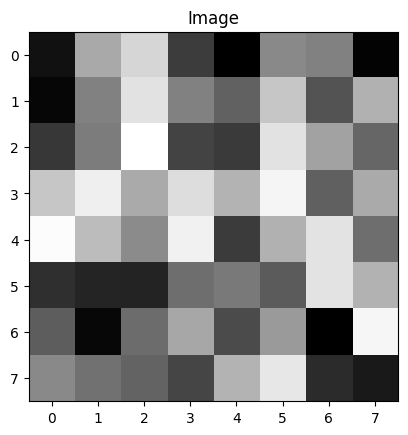

In [65]:
image = np.random.uniform(low=0, high=255, size=(8,8)).astype(int)
plt.imshow(image, cmap='gray')
plt.title('Image')
plt.show()

## Simulate GQIR in Qiskit

C:\Users\HCI\AppData\Local\Temp\ipykernel_12044\4244749152.py:59: DeprecationWarning: Using a qobj for run() is deprecated as of qiskit-aer 0.9.0 and will be removed no sooner than 3 months from that release date. Transpiled circuits should now be passed directly using `backend.run(circuits, **run_options).
  job_gqir = aer_sim.run(qobj)


1.18043 sec
[ 17. 168. 213.  60.   0. 136. 128.   3.   6. 128. 225. 128.  97. 197.
  83. 176.  55. 124. 254.  67.  58. 225. 161. 102. 197. 238. 169. 220.
 179. 244.  96. 169. 251. 187. 138. 240.  59. 176. 227. 110.  47.  36.
  35. 110. 122.  91. 227. 177.  93.   7. 108. 166.  75. 153.   0. 245.
 136. 113.  99.  69. 178. 230.  43.  25.] 
 [ 17 168 213  60   0 136 128   3   6 128 225 128  97 197  83 176  55 124
 254  67  58 225 161 102 197 238 169 220 179 244  96 169 251 187 138 240
  59 176 227 110  47  36  35 110 122  91 227 177  93   7 108 166  75 153
   0 245 136 113  99  69 178 230  43  25]


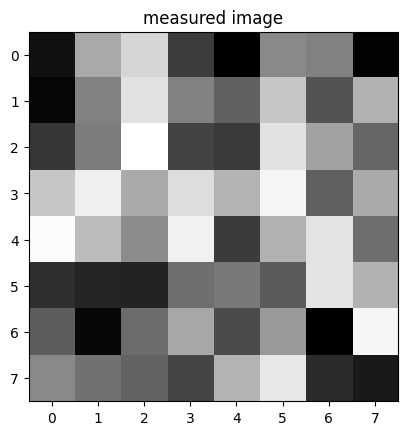

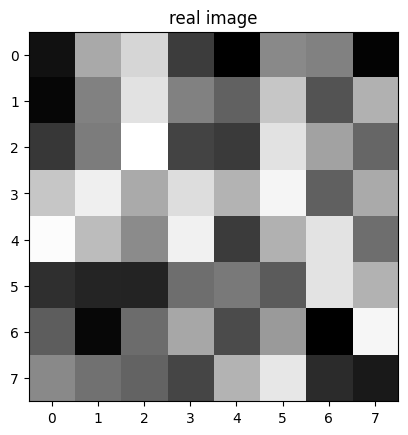

MSE = 0.0


In [66]:
start = time.time()

x = int(np.ceil(math.log(image.shape[0], 2)))
if int(x) == 0: x = 1
y = int(np.ceil(math.log(image.shape[1], 2)))
if int(y) == 0: y = 1
q = 8

color = QuantumRegister(q, 'color')
y_ax = QuantumRegister(y, 'y axis')
x_ax = QuantumRegister(x, 'x axis')
classic = ClassicalRegister(x+y+q, 'classic')
qc_gqir = QuantumCircuit(color, y_ax, x_ax, classic)

qc_gqir.id(color)
qc_gqir.h(x_ax)
qc_gqir.h(y_ax)

controls_ = []
for i, _ in enumerate(x_ax):
    controls_.extend([x_ax[i]])
for i, _ in enumerate(y_ax):
    controls_.extend([y_ax[i]])  
for xi in range(image.shape[0]):
    xi_bin = "{0:b}".format(xi).zfill(x_ax.size)
    for i, bit in enumerate(xi_bin):
        if not int(bit):
            qc_gqir.x(x_ax[i])  

    for yi in range(image.shape[1]):
        yi_bin = "{0:b}".format(yi).zfill(y_ax.size)
        for i, bit in enumerate(yi_bin):
            if not int(bit):
                qc_gqir.x(y_ax[i]) 

        intensity_bin = "{0:b}".format(image[xi, yi]).zfill(len(color))
        xg = XGate(None).control(len(controls_))
        target = []
        for i, bit in enumerate(intensity_bin):
            if int(bit):
                qc_gqir.mcx(controls_, color[i])

        for i, bit in enumerate(yi_bin):
            if not int(bit):
                qc_gqir.x(y_ax[i])

    for i, bit in enumerate(xi_bin):
        if not int(bit):
            qc_gqir.x(x_ax[i])


qc_gqir.measure(x_ax, range(x_ax.size))
qc_gqir.measure(y_ax, range(x_ax.size, x_ax.size+y_ax.size))
qc_gqir.measure(color, range(x_ax.size+y_ax.size,x_ax.size+y_ax.size+color.size))

aer_sim = Aer.get_backend('aer_simulator')
t_qc_image = transpile(qc_gqir, aer_sim)
qobj = assemble(t_qc_image, shots=200000)
job_gqir = aer_sim.run(qobj)
result_gqir = job_gqir.result()
counts_gqir = result_gqir.get_counts()
counts_gqir = (["".join(list(reversed(c))) for c in counts_gqir])

out_pixels = []
for item in counts_gqir:
    out_pixels.append((int(item[0:x], 2), int(item[x:x+y],2), int(item[-q:],2)))
out_image = np.zeros(image.shape)
for pixel in out_pixels:
    if pixel[0]<out_image.shape[0]:
        if pixel[1]<out_image.shape[1]:
            out_image[pixel[0], pixel[1]] = pixel[2]

end = time.time()
print(f"{end - start:.5f} sec")

print(out_image.flatten(), '\n', image.flatten())
plot_to_compare(out_image, image)

error = []
for i in range(image.size):
    del_ = out_image.flatten()[i] - image.flatten()[i]
    err = del_**2
    error.append(err)
    
MSE = sum(error)/image.size
print("MSE =",MSE)

## Simulate GQIR in IonQ

8.28514 sec
[ 17. 168. 213.  60.   0. 136. 128.   3.   6. 128. 225. 128.  97. 197.
  83. 176.  55. 124. 254.  67.  58. 225. 161. 102. 197. 238. 169. 220.
 179. 244.  96. 169. 251. 187. 138. 240.  59. 176. 227. 110.  47.  36.
  35. 110. 122.  91. 227. 177.  93.   7. 108. 166.  75. 153.   0. 245.
 136. 113.  99.  69. 178. 230.  43.  25.] 
 [ 17 168 213  60   0 136 128   3   6 128 225 128  97 197  83 176  55 124
 254  67  58 225 161 102 197 238 169 220 179 244  96 169 251 187 138 240
  59 176 227 110  47  36  35 110 122  91 227 177  93   7 108 166  75 153
   0 245 136 113  99  69 178 230  43  25]


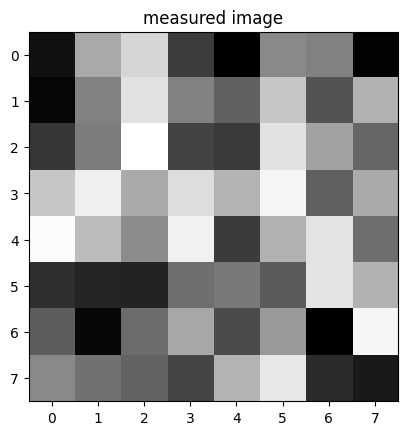

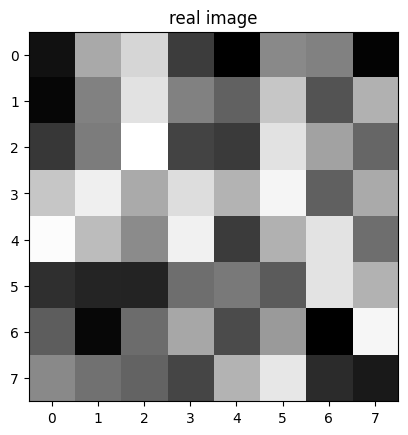

MSE = 0.0


In [67]:
start = time.time()

x = int(np.ceil(math.log(image.shape[0], 2)))
if int(x) == 0: x = 1
y = int(np.ceil(math.log(image.shape[1], 2)))
if int(y) == 0: y = 1
q = 8

color = QuantumRegister(q, 'color')
y_ax = QuantumRegister(y, 'y axis')
x_ax = QuantumRegister(x, 'x axis')
classic = ClassicalRegister(x+y+q, 'classic')
qc_gqir = QuantumCircuit(color, y_ax, x_ax, classic)

qc_gqir.id(color)
qc_gqir.h(x_ax)
qc_gqir.h(y_ax)

controls_ = []
for i, _ in enumerate(x_ax):
    controls_.extend([x_ax[i]])
for i, _ in enumerate(y_ax):
    controls_.extend([y_ax[i]])  
for xi in range(image.shape[0]):
    xi_bin = "{0:b}".format(xi).zfill(x_ax.size)
    for i, bit in enumerate(xi_bin):
        if not int(bit):
            qc_gqir.x(x_ax[i])  

    for yi in range(image.shape[1]):
        yi_bin = "{0:b}".format(yi).zfill(y_ax.size)
        for i, bit in enumerate(yi_bin):
            if not int(bit):
                qc_gqir.x(y_ax[i]) 

        intensity_bin = "{0:b}".format(image[xi, yi]).zfill(len(color))
        xg = XGate(None).control(len(controls_))
        target = []
        for i, bit in enumerate(intensity_bin):
            if int(bit):
                qc_gqir.mcx(controls_, color[i])

        for i, bit in enumerate(yi_bin):
            if not int(bit):
                qc_gqir.x(y_ax[i])

    for i, bit in enumerate(xi_bin):
        if not int(bit):
            qc_gqir.x(x_ax[i])


qc_gqir.measure(x_ax, range(x_ax.size))
qc_gqir.measure(y_ax, range(x_ax.size, x_ax.size+y_ax.size))
qc_gqir.measure(color, range(x_ax.size+y_ax.size,x_ax.size+y_ax.size+color.size))

simulator_backend = provider.get_backend("ionq_simulator")
t_qc_image = transpile(qc_gqir, simulator_backend)
job_gqir = simulator_backend.run(t_qc_image, shots=200000)
result_gqir = job_gqir.result()
counts_gqir = result_gqir.get_counts()
counts_gqir = (["".join(list(reversed(c))) for c in counts_gqir])


out_pixels = []
for item in counts_gqir:
    out_pixels.append((int(item[0:x], 2), int(item[x:x+y],2), int(item[-q:],2)))
out_image = np.zeros(image.shape)
for pixel in out_pixels:
    if pixel[0]<out_image.shape[0]:
        if pixel[1]<out_image.shape[1]:
            out_image[pixel[0], pixel[1]] = pixel[2]

end = time.time()
print(f"{end - start:.5f} sec")

print(out_image.flatten(), '\n', image.flatten())
plot_to_compare(out_image, image)

error = []
for i in range(image.size):
    del_ = out_image.flatten()[i] - image.flatten()[i]
    err = del_**2
    error.append(err)
    
MSE = sum(error)/image.size
print("MSE =",MSE)

C:\Users\HCI\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\qiskit\visualization\circuit\matplotlib.py:266: FutureWarning: The default matplotlib drawer scheme will be changed to "iqp" in a following release. To silence this warning, specify the current default explicitly as style="clifford", or the new default as style="iqp".
  self._style, def_font_ratio = load_style(self._style)


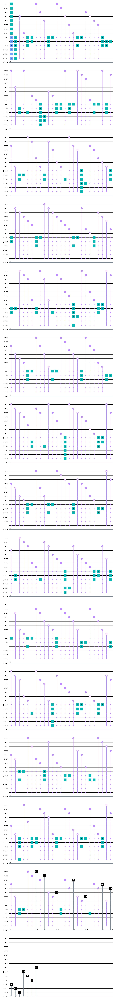

In [72]:
qc_gqir.draw('mpl')

# OQIM

## Simulate OQIM in Qiskit

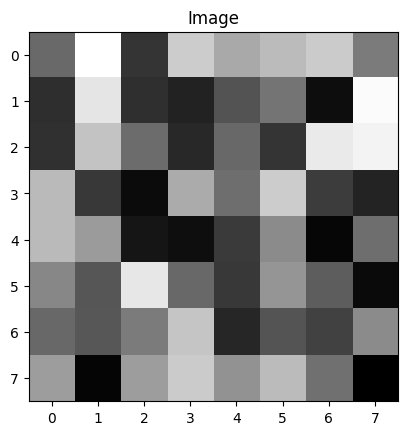

In [120]:
image = np.random.uniform(low=0, high=255, size=(8,8)).astype(int)
plt.imshow(image, cmap='gray')
plt.title('Image')
plt.show()

[108 256  55 201 172 188 208 125  49 230  56  38  90 116  21 250  51 193
 110  45 109  56 229 243 189  64  21 168 118 204  65  42 184 155  29  17
  65 140  15 112 137  90 230 108  64 152  98  11 108  94 126 200  43  93
  68 142 160  10 155 200 148 187 117   8] 
 [109 254  59 204 171 188 203 126  52 228  53  40  88 119  20 250  55 196
 112  46 108  58 233 243 187  62  18 172 114 204  66  41 187 157  28  21
  63 142  13 114 138  90 230 108  62 151  97  17 108  91 126 198  44  89
  70 142 159  12 159 203 148 188 116   7]
2.58047 sec


C:\Users\HCI\AppData\Local\Temp\ipykernel_12044\880167362.py:71: DeprecationWarning: Using a qobj for run() is deprecated as of qiskit-aer 0.9.0 and will be removed no sooner than 3 months from that release date. Transpiled circuits should now be passed directly using `backend.run(circuits, **run_options).
  job_oqim = aer_sim.run(qobj)


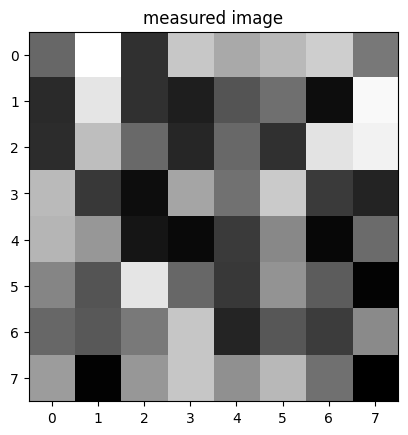

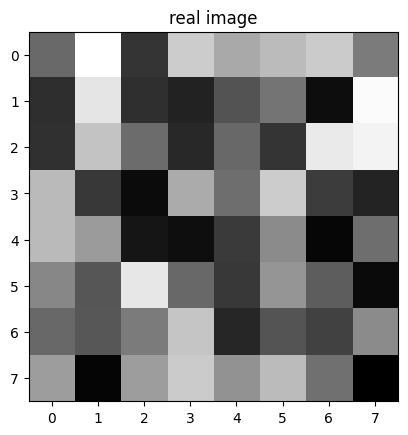

MSE = 5.546875


In [121]:
start = time.time()

w_bits = int(np.ceil(math.log(image.shape[1],2)))
h_bits = int(np.ceil(math.log(image.shape[0],2)))
if not w_bits: w_bits = 1
if not h_bits: h_bits = 1

im_list = image.flatten()
ind_list = sorted(range(len(im_list)), key=lambda k:im_list[k])
max_index = max(ind_list)
#now in angles: theta = intensity, phi = coordinate
thetas = np.interp(im_list, (0, 256), (0, np.pi/2))
phis = np.interp(range(len(im_list)), (0, len(im_list)), (0, np.pi/2))

num_ind_bits = int(np.ceil(math.log(len(im_list),2)))
if not num_ind_bits:
    num_ind_bits = 1
O = QuantumRegister(num_ind_bits, 'o_reg')
c = QuantumRegister(1,'c_reg')
p = QuantumRegister(1, 'p_reg')
cr = ClassicalRegister(O.size+c.size+p.size, "cl_reg")

qc_oqim = QuantumCircuit(c, p, O, cr)
num_qubits = qc_oqim.num_qubits
input_im = image.copy().flatten()
qc_oqim.id(c)
qc_oqim.h(O)
qc_oqim.h(p)
controls_ = []
for i, _ in enumerate(O):
    controls_.extend([O[i]])
for i, _ in enumerate(p):
    controls_.extend([p[i]]) 

for i, (phi, theta) in enumerate(zip(phis, thetas)):
    qubit_index_bin = "{0:b}".format(i).zfill(num_ind_bits)
    
    for k, qub_ind in enumerate(qubit_index_bin):
        if int(qub_ind):
            qc_oqim.x(O[k])
            

    
    for coord_or_intns in (0,1):
        if not coord_or_intns:
            qc_oqim.mcry(theta=2*theta,
                          q_controls=controls_,
                          q_target=c[0])
        else:
            qc_oqim.x(p)
            qc_oqim.mcry(theta=2*phi,
                          q_controls=controls_,
                          q_target=c[0])
            if i!=len(thetas) - 1:
                qc_oqim.x(p)
       

    
    if  i!=len(thetas) - 1:
        for k, qub_ind in enumerate(qubit_index_bin):
            if int(qub_ind):
                qc_oqim.x(O[k])
           


qc_oqim.measure(list(reversed(range(qc_oqim.num_qubits))), list(range(cr.size)))

aer_sim = Aer.get_backend('aer_simulator')
t_qc_image = transpile(qc_oqim, aer_sim)
qobj = assemble(t_qc_image, shots=200000)
job_oqim = aer_sim.run(qobj)
result_oqim = job_oqim.result()
counts_oqim = result_oqim.get_counts()

classical_colors = []
classical_coords = []
for i in range(0, max_index+1):
    color_list = []
    coord_list = []
    for item in counts_oqim.items():
        key = item[0]
        amount = item[1]
        bin_coord = key[2:]
        int_coord = int(bin_coord, 2)
        if int_coord == i:
            if not int(key[1]):
                color_list.append((key[0], amount))
            else:
                coord_list.append((key[0], amount))
    color_amount = 0
    for color, amount in color_list:
        if not int(color):
            color_amount=color_amount+amount
    try:
        color = np.arccos((color_amount/sum(n for _, n in color_list))**(1/2))
        classical_colors.append(color)
    except ZeroDivisionError:
        print("ZeroDivisionError")
        
    coord_amount = 0
    for coord, amount in coord_list:
        if not int(coord):
            coord_amount=coord_amount+amount
    try:
        coord = np.arccos((coord_amount/sum(n for _, n in coord_list))**(1/2))
        classical_coords.append(coord)
    except ZeroDivisionError:
        print("ZeroDivisionError")
classical_colors = np.interp(classical_colors, (0, np.pi/2), (0, 256)).astype(int)
classical_coords = np.interp(classical_coords, (0, np.pi/2), (0, len(im_list))).astype(int)
output_im = classical_colors.reshape(image.shape)

end = time.time()
print(output_im.flatten(), '\n', image.flatten())
print(f"{end - start:.5f} sec")
plot_to_compare(output_im, image)


error = []
for i in range(image.size):
    del_ = output_im.flatten()[i] - image.flatten()[i]
    err = del_**2
    error.append(err)
error 

MSE = sum(error)/image.size
print("MSE =",MSE)

## Simulate OQIM in IonQ

[107 256  59 206 169 186 200 129  58 230  56  38  88 119  18 251  56 198
 113  47 107  57 230 241 184  64  19 172 112 202  63  41 188 159  28  21
  61 142  15 116 134  88 227 108  61 152  96  15 108  92 127 198  46  90
  69 143 160   9 159 200 148 187 113   8] 
 [109 254  59 204 171 188 203 126  52 228  53  40  88 119  20 250  55 196
 112  46 108  58 233 243 187  62  18 172 114 204  66  41 187 157  28  21
  63 142  13 114 138  90 230 108  62 151  97  17 108  91 126 198  44  89
  70 142 159  12 159 203 148 188 116   7]
12.43070 sec


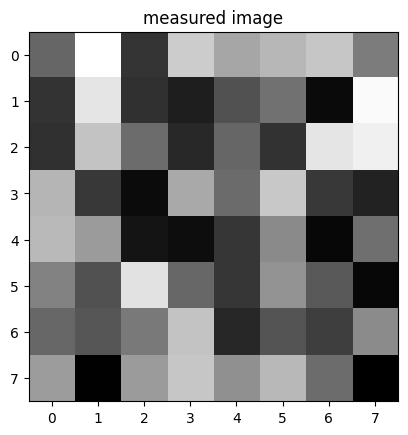

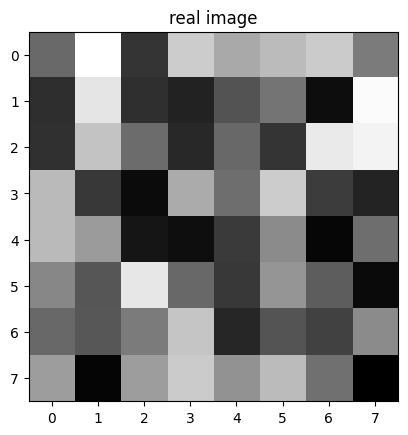

MSE = 3.765625


In [122]:
start = time.time()

w_bits = int(np.ceil(math.log(image.shape[1],2)))
h_bits = int(np.ceil(math.log(image.shape[0],2)))
if not w_bits: w_bits = 1
if not h_bits: h_bits = 1

im_list = image.flatten()
ind_list = sorted(range(len(im_list)), key=lambda k:im_list[k])
max_index = max(ind_list)
#now in angles: theta = intensity, phi = coordinate
thetas = np.interp(im_list, (0, 256), (0, np.pi/2))
phis = np.interp(range(len(im_list)), (0, len(im_list)), (0, np.pi/2))

num_ind_bits = int(np.ceil(math.log(len(im_list),2)))
if not num_ind_bits:
    num_ind_bits = 1
O = QuantumRegister(num_ind_bits, 'o_reg')
c = QuantumRegister(1,'c_reg')
p = QuantumRegister(1, 'p_reg')
cr = ClassicalRegister(O.size+c.size+p.size, "cl_reg")

qc_oqim = QuantumCircuit(c, p, O, cr)
num_qubits = qc_oqim.num_qubits
input_im = image.copy().flatten()
qc_oqim.id(c)
qc_oqim.h(O)
qc_oqim.h(p)
controls_ = []
for i, _ in enumerate(O):
    controls_.extend([O[i]])
for i, _ in enumerate(p):
    controls_.extend([p[i]]) 

for i, (phi, theta) in enumerate(zip(phis, thetas)):
    qubit_index_bin = "{0:b}".format(i).zfill(num_ind_bits)
    
    for k, qub_ind in enumerate(qubit_index_bin):
        if int(qub_ind):
            qc_oqim.x(O[k])
            

    
    for coord_or_intns in (0,1):
        if not coord_or_intns:
            qc_oqim.mcry(theta=2*theta,
                          q_controls=controls_,
                          q_target=c[0])
        else:
            qc_oqim.x(p)
            qc_oqim.mcry(theta=2*phi,
                          q_controls=controls_,
                          q_target=c[0])
            if i!=len(thetas) - 1:
                qc_oqim.x(p)
       

    
    if  i!=len(thetas) - 1:
        for k, qub_ind in enumerate(qubit_index_bin):
            if int(qub_ind):
                qc_oqim.x(O[k])
           


qc_oqim.measure(list(reversed(range(qc_oqim.num_qubits))), list(range(cr.size)))

ionq_sim = provider.get_backend("ionq_simulator")
t_qc_image = transpile(qc_oqim, ionq_sim)
job_oqim = ionq_sim.run(t_qc_image, shots=200000)
result_oqim = job_oqim.result()
counts_oqim = result_oqim.get_counts()

classical_colors = []
classical_coords = []
for i in range(0, max_index+1):
    color_list = []
    coord_list = []
    for item in counts_oqim.items():
        key = item[0]
        amount = item[1]
        bin_coord = key[2:]
        int_coord = int(bin_coord, 2)
        if int_coord == i:
            if not int(key[1]):
                color_list.append((key[0], amount))
            else:
                coord_list.append((key[0], amount))
    color_amount = 0
    for color, amount in color_list:
        if not int(color):
            color_amount=color_amount+amount
    try:
        color = np.arccos((color_amount/sum(n for _, n in color_list))**(1/2))
        classical_colors.append(color)
    except ZeroDivisionError:
        print("ZeroDivisionError")
        
    coord_amount = 0
    for coord, amount in coord_list:
        if not int(coord):
            coord_amount=coord_amount+amount
    try:
        coord = np.arccos((coord_amount/sum(n for _, n in coord_list))**(1/2))
        classical_coords.append(coord)
    except ZeroDivisionError:
        print("ZeroDivisionError")
classical_colors = np.interp(classical_colors, (0, np.pi/2), (0, 256)).astype(int)
classical_coords = np.interp(classical_coords, (0, np.pi/2), (0, len(im_list))).astype(int)
output_im = classical_colors.reshape(image.shape)

end = time.time()
print(output_im.flatten(), '\n', image.flatten())
print(f"{end - start:.5f} sec")
plot_to_compare(output_im, image)


error = []
for i in range(image.size):
    del_ = output_im.flatten()[i] - image.flatten()[i]
    err = del_**2
    error.append(err)
error 

MSE = sum(error)/image.size
print("MSE =",MSE)

In [124]:
qc_oqim.draw('mpl')

# Time Complexity Compare

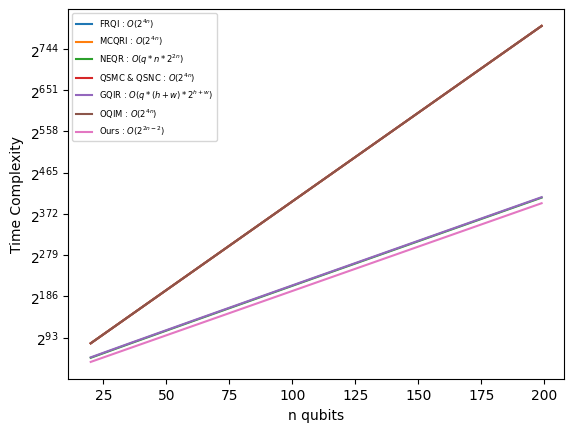

In [126]:
import numpy as np
import matplotlib.pyplot as plt

# n qubits can represent 2**n pixels. Thus, Total number of used qubits are 2n qubits.

# Big-O represent of FRQI
n = np.arange(20,200)

n = n.astype(np.float64)

y_frqi = 2**(4*n)

# Big-O represent of NEQR

y_neqr = 8 * n*2**(2*n)

# Big-O represent of QSMC & QSNC 

y_qsmc = 2**(4*n)

# Big-O represent of MCQRI

y_mcqri = 2**(4*n)

# Big-O represent of GQIR
h =n
w = n

y_gqir  = []
for i in range(len(n)):
    sum = 0
    sum += h[i]
    sum += w[i]
    time = 8 *sum*2**(sum)
    y_gqir.append(time)

# Big-O represent of oqim

y_oqim = 2**(4*n)


y_ours = 2**(2*n-2)


plt.plot(n, y_frqi, label = 'FRQI : $O(2^{4n})$')
plt.plot(n, y_mcqri, label = 'MCQRI : $O(2^{4n})$')
plt.plot(n, y_neqr, label = 'NEQR : $O(q*n*2^{2n})$')
plt.plot(n, y_qsmc, label = 'QSMC & QSNC : $O(2^{4n})$')
plt.plot(n, y_gqir, label = 'GQIR : $O(q*(h+w)*2^{h+w})$')
plt.plot(n, y_oqim, label = 'OQIM : $O(2^{4n})$')
plt.plot(n, y_ours, label = 'Ours : $O(2^{2n-2})$')



plt.xlabel('n qubits')
plt.ylabel('Time Complexity')
plt.yscale('log', base=2)
plt.legend(fontsize="6")

plt.show()